In [1]:
from omegaconf import OmegaConf
import pickle
from util.phylo_utils import construct_phylo_tree, construct_discretized_phylo_tree
import os
import matplotlib.pyplot as plt

In [2]:
# run_path = '/home/harishbabu/projects/PIPNet/runs/010-CUB-27-imgnet_OOD_cnext26_img=224_nprotos=20'
run_path = '/home/harishbabu/projects/PIPNet/runs/031-CUB-18-imgnet_cnext26_img=224_nprotos=20_orth-on-rel'
args_file = open(os.path.join(run_path, 'metadata', 'args.pickle'), 'rb')
args = pickle.load(args_file)

if args.phylo_config:
    phylo_config = OmegaConf.load(args.phylo_config)

if args.phylo_config:
    # construct the phylo tree
    if phylo_config.phyloDistances_string == 'None':
        root = construct_phylo_tree(phylo_config.phylogeny_path)
        print('-'*25 + ' No discretization ' + '-'*25)
    else:
        root = construct_discretized_phylo_tree(phylo_config.phylogeny_path, phylo_config.phyloDistances_string)
        print('-'*25 + ' Discretized ' + '-'*25)
else:
    # construct the tree (original hierarchy as described in the paper)
    root = Node("root")
    root.add_children(['animal','vehicle','everyday_object','weapon','scuba_diver'])
    root.add_children_to('animal',['non_primate','primate'])
    root.add_children_to('non_primate',['African_elephant','giant_panda','lion'])
    root.add_children_to('primate',['capuchin','gibbon','orangutan'])
    root.add_children_to('vehicle',['ambulance','pickup','sports_car'])
    root.add_children_to('everyday_object',['laptop','sandal','wine_bottle'])
    root.add_children_to('weapon',['assault_rifle','rifle'])
    # flat root
    # root.add_children(['scuba_diver','African_elephant','giant_panda','lion','capuchin','gibbon','orangutan','ambulance','pickup','sports_car','laptop','sandal','wine_bottle','assault_rifle','rifle'])
root.assign_all_descendents()

------------------------- No discretization -------------------------


In [3]:
print(root)

root
	052+004
		052+053
			cub_052_Pied_billed_Grebe
			053+051
				cub_053_Western_Grebe
				051+050
					cub_051_Horned_Grebe
					cub_050_Eared_Grebe
		004+086
			004+032
				cub_004_Groove_billed_Ani
				032+031
					cub_032_Mangrove_Cuckoo
					031+033
						cub_031_Black_billed_Cuckoo
						cub_033_Yellow_billed_Cuckoo
			086+045
				cub_086_Pacific_Loon
				045+100
					045+003
						cub_045_Northern_Fulmar
						003+001
							cub_003_Sooty_Albatross
							001+002
								cub_001_Black_footed_Albatross
								cub_002_Laysan_Albatross
					100+023
						100+101
							cub_100_Brown_Pelican
							cub_101_White_Pelican
						023+024
							cub_023_Brandt_Cormorant
							024+025
								cub_024_Red_faced_Cormorant
								cub_025_Pelagic_Cormorant



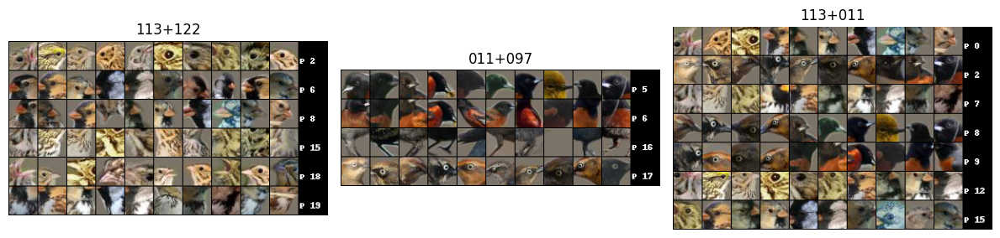

In [11]:
# folder_paths = [
#     # "/home/harishbabu/projects/PIPNet/runs/022-CUB-27-imgnet_cnext26_img=224_nprotos=20",
#     # "/home/harishbabu/projects/PIPNet/runs/022-CUB-27-imgnet_OOD_cnext26_img=224_nprotos=20",
#     # "/home/harishbabu/projects/PIPNet/runs/023-CUB-27-imgnet_cnext26_img=224_nprotos=20",
#     # "/home/harishbabu/projects/PIPNet/runs/024-CUB-27-imgnet_OOD_cnext26_img=224_nprotos=20_orth",
#     "/home/harishbabu/projects/PIPNet/runs/026-CUB-27-imgnet_OOD_cnext26_img=224_nprotos=20_orth",
#     "/home/harishbabu/projects/PIPNet/runs/027-CUB-27-imgnet_OOD_cnext26_img=224_nprotos=20_orth-on-rel",
#     "/home/harishbabu/projects/PIPNet/runs/028-CUB-27_OOD_cnext26_img=224_nprotos=20_orth-on-rel"
#     # Add more folder paths as needed
# ]

# node_names = os.listdir(os.path.join(folder_paths[0], 'visualised_prototypes_topk'))
node_names = ['cub_032_Mangrove_Cuckoo', '011+097', '032+031']
# folder_path = "/home/harishbabu/projects/PIPNet/runs/027-CUB-27-imgnet_OOD_cnext26_img=224_nprotos=20_orth-on-rel"
folder_path = run_path
images = []
for node_name in node_names:
    image_path = os.path.join(folder_path, f"./visualised_prototypes_topk/{node_name}/grid_topk_all.png")
    if os.path.exists(image_path):
        images.append(plt.imread(image_path))

# Create a grid plot with one row
fig, axes = plt.subplots(1, len(images), figsize=(12, 4))

# Display images in the grid
for i, image in enumerate(images):
    axes[i].imshow(image)
    axes[i].axis('off')
    axes[i].title.set_text(node_names[i])

# Adjust spacing between subplots
plt.tight_layout()

# Show the grid of images
plt.show()


113+011


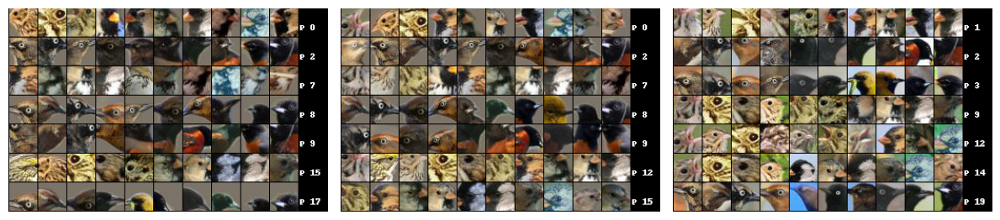

060+143


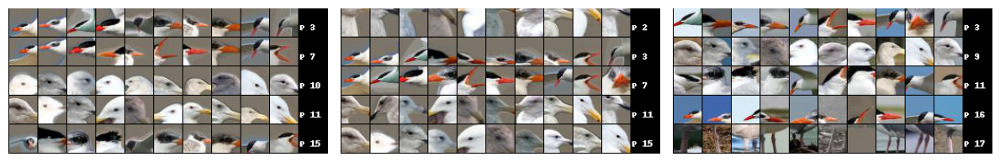

113+118


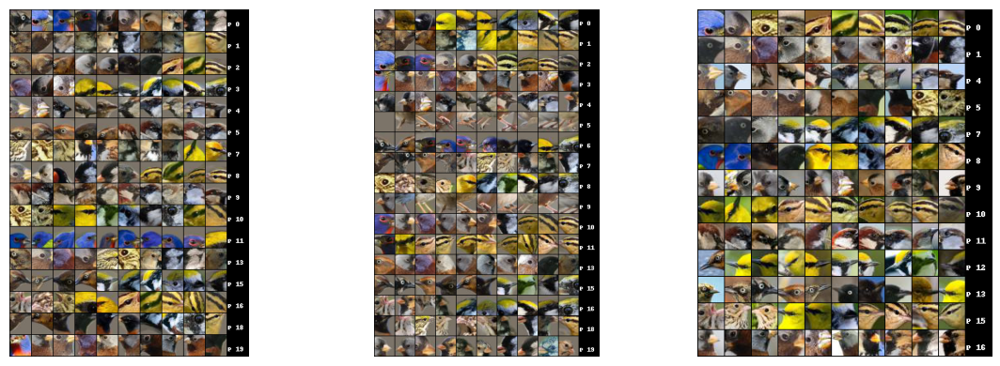

113+194


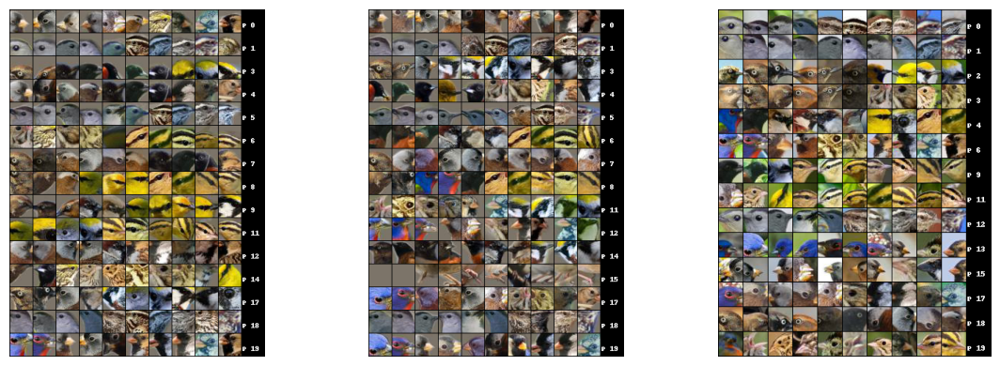

037+077


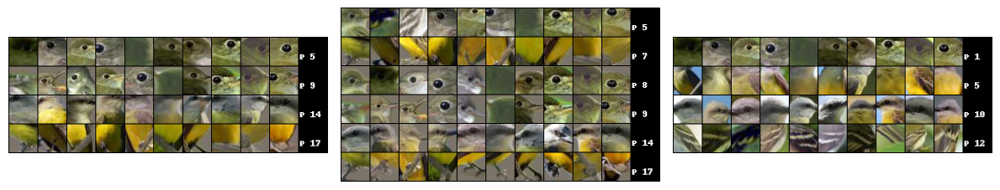

113+060


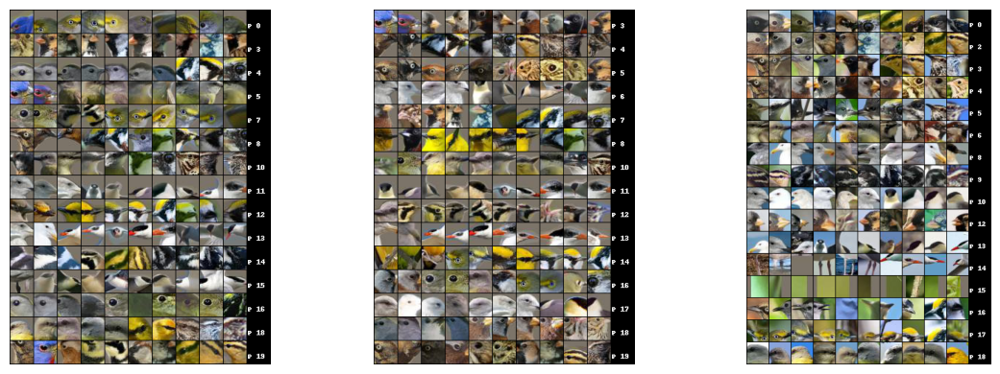

113+085


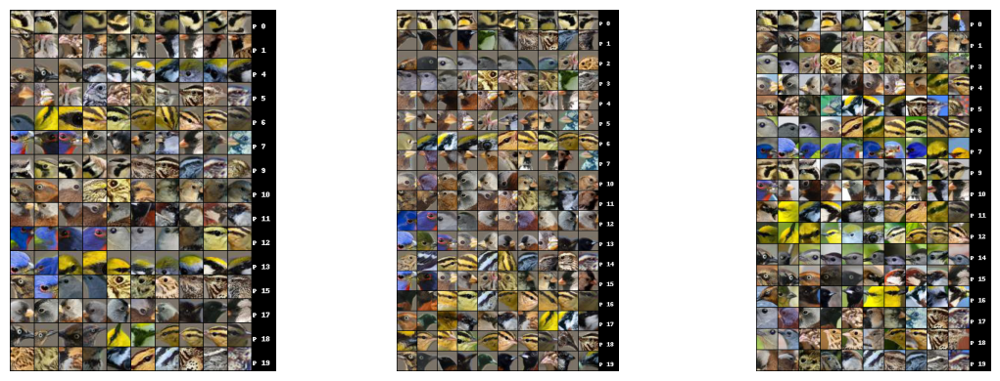

194+019


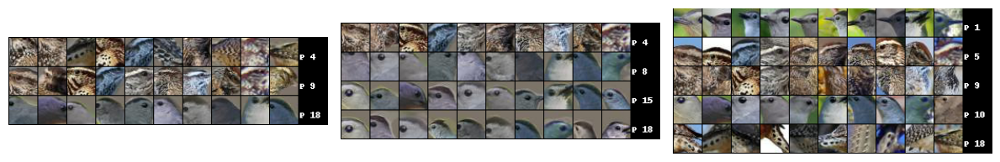

165+161


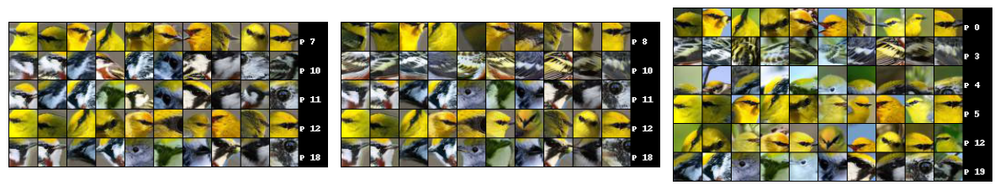

165+181


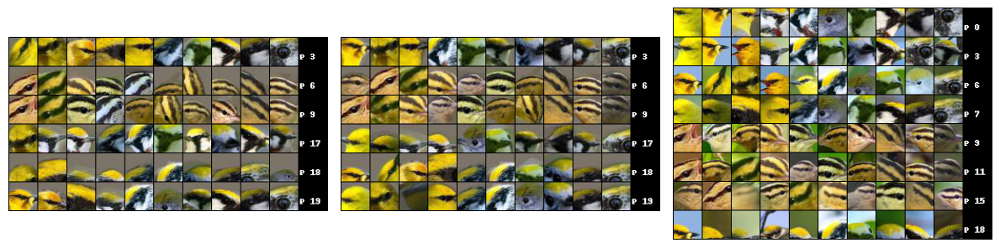

113+122


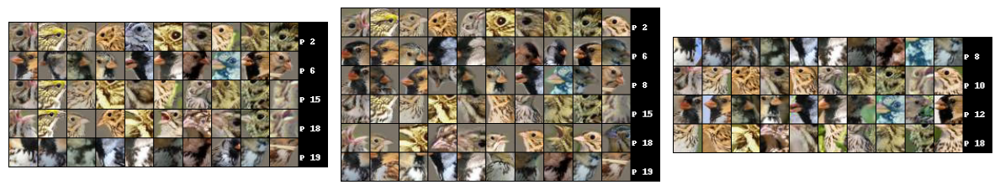

011+097


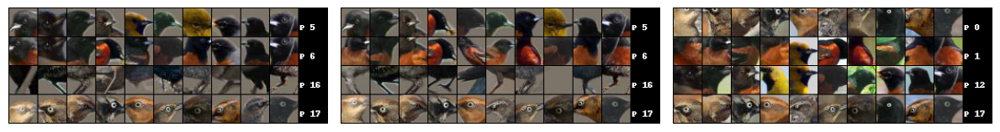

113+016


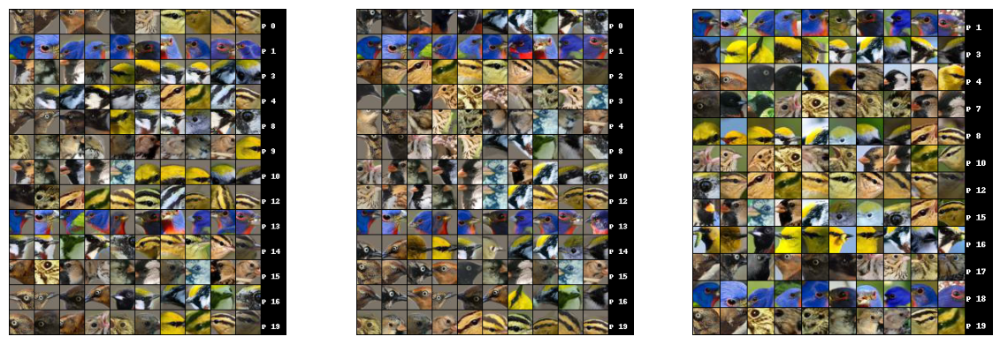

113+187


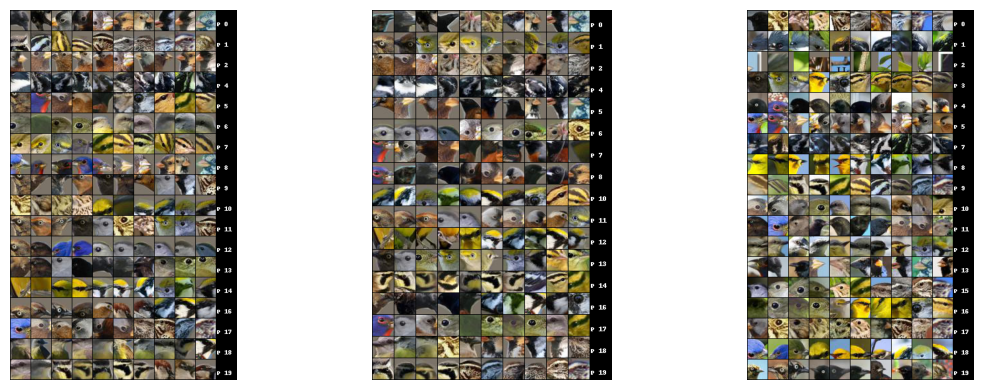

113+165


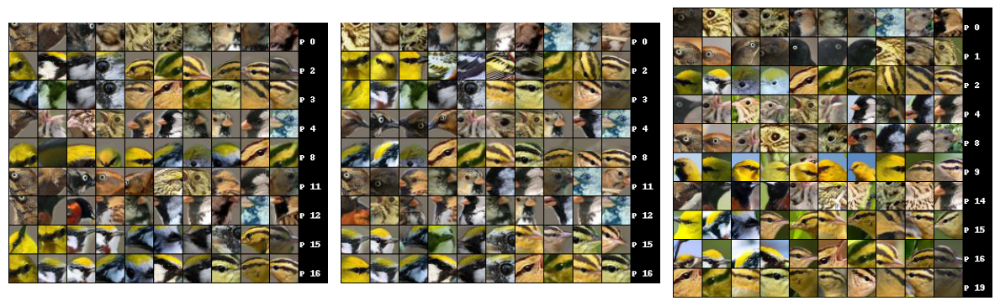

001+052


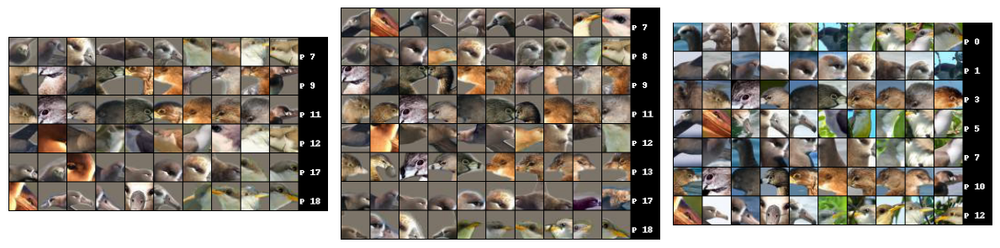

113+030


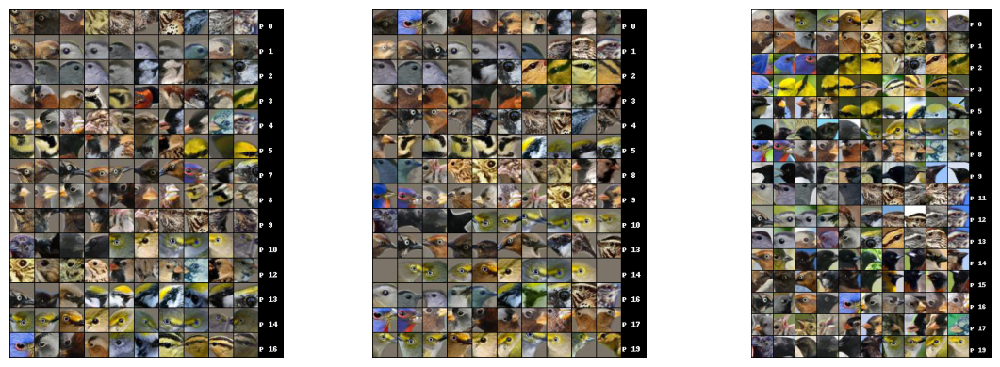

001+033


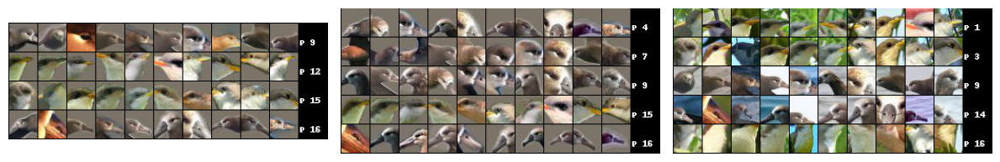

060+071


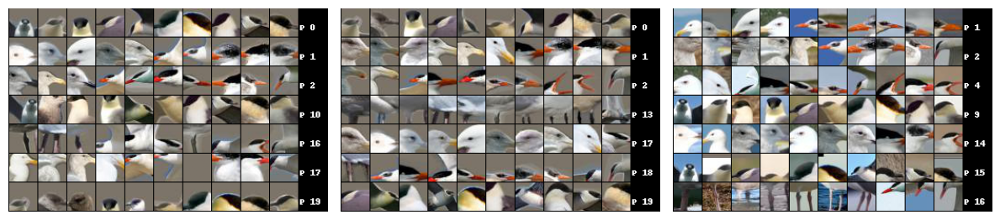

root


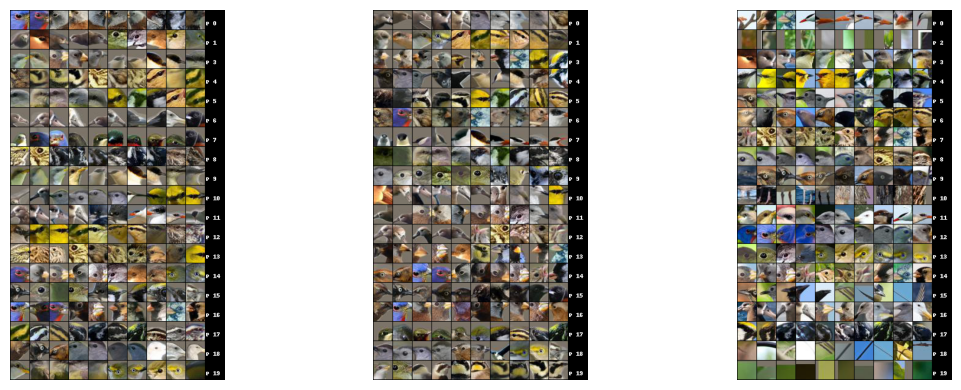

113+037


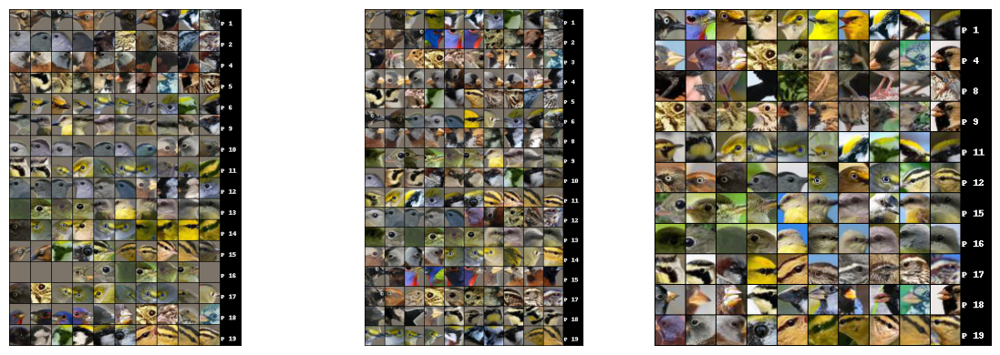

187+079


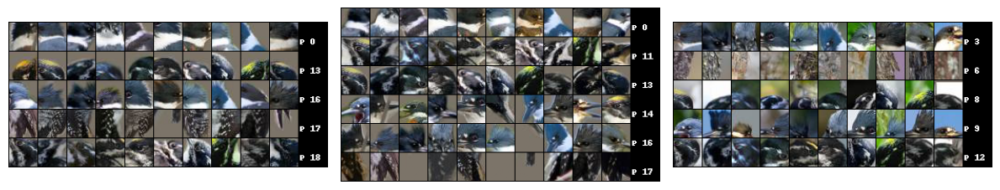

113+034


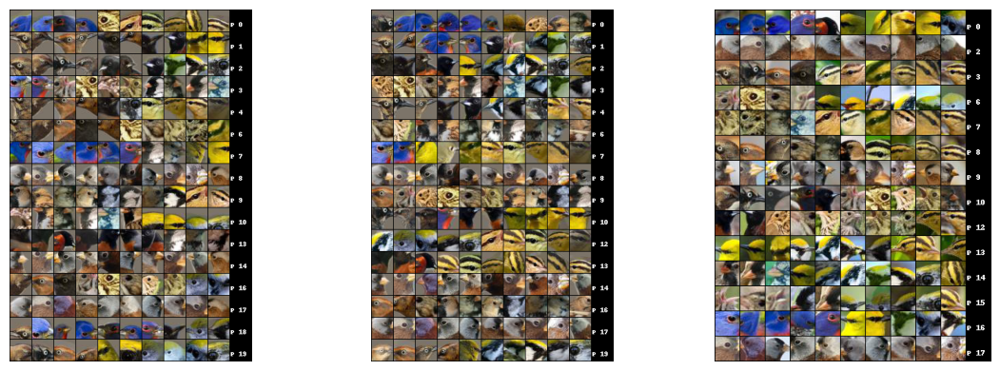

113+001+068


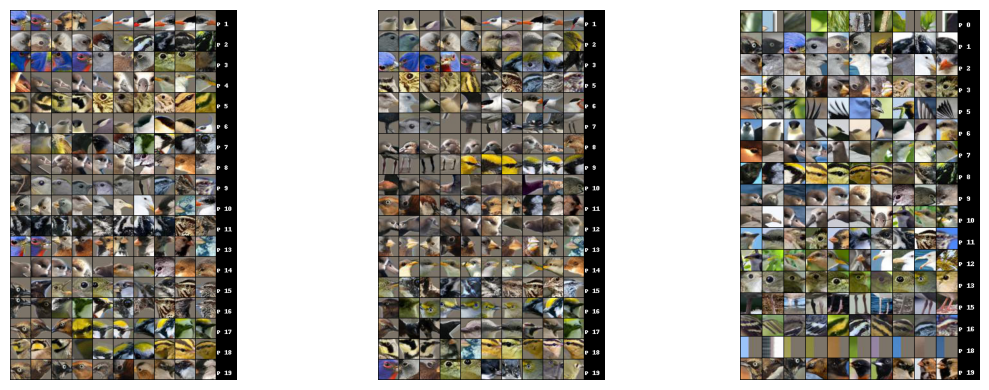

030+156


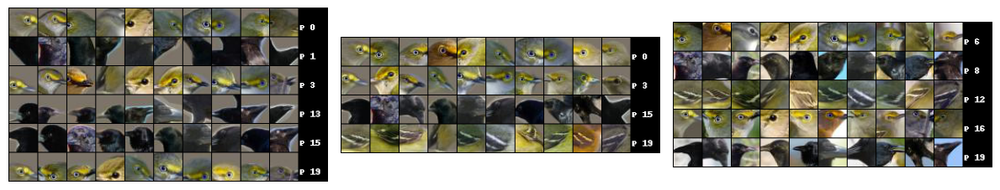

In [2]:
import os
import matplotlib.pyplot as plt

folder_paths = [
    # "/home/harishbabu/projects/PIPNet/runs/022-CUB-27-imgnet_cnext26_img=224_nprotos=20",
    # "/home/harishbabu/projects/PIPNet/runs/022-CUB-27-imgnet_OOD_cnext26_img=224_nprotos=20",
    # "/home/harishbabu/projects/PIPNet/runs/023-CUB-27-imgnet_cnext26_img=224_nprotos=20",
    # "/home/harishbabu/projects/PIPNet/runs/024-CUB-27-imgnet_OOD_cnext26_img=224_nprotos=20_orth",
    "/home/harishbabu/projects/PIPNet/runs/026-CUB-27-imgnet_OOD_cnext26_img=224_nprotos=20_orth",
    "/home/harishbabu/projects/PIPNet/runs/027-CUB-27-imgnet_OOD_cnext26_img=224_nprotos=20_orth-on-rel",
    "/home/harishbabu/projects/PIPNet/runs/028-CUB-27_OOD_cnext26_img=224_nprotos=20_orth-on-rel"
    # Add more folder paths as needed
]

node_names = os.listdir(os.path.join(folder_paths[0], 'visualised_prototypes_topk'))

for node_name in node_names:
    print(node_name)
    images = []
    for folder_path in folder_paths:
        image_path = os.path.join(folder_path, f"./visualised_prototypes_topk/{node_name}/grid_topk_all.png")
        if os.path.exists(image_path):
            images.append(plt.imread(image_path))

    # Create a grid plot with one row
    fig, axes = plt.subplots(1, len(images), figsize=(12, 4))

    # Display images in the grid
    for i, image in enumerate(images):
        axes[i].imshow(image)
        axes[i].axis('off')

    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the grid of images
    plt.show()
